# Regresja liniowa: czym jest ML

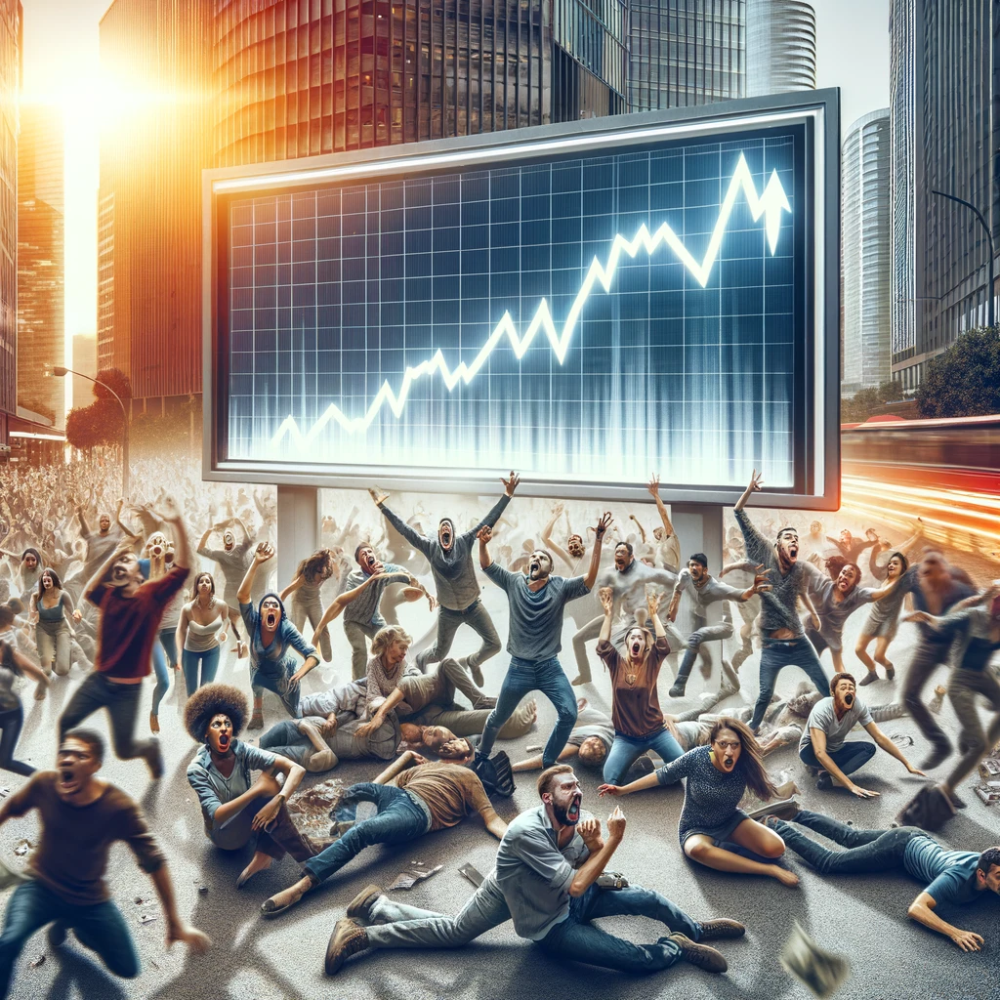

In [25]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

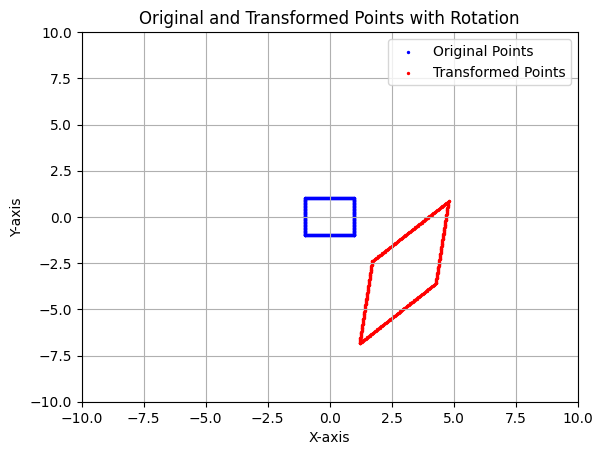

In [26]:
import numpy as np
import matplotlib.pyplot as plt


# Generate random points along the edges of a square
def generate_square_points(n):
    edge_points = n // 4
    top_edge = np.column_stack((np.linspace(-1, 1, edge_points), np.ones(edge_points)))
    bottom_edge = np.column_stack((np.linspace(-1, 1, edge_points), -np.ones(edge_points)))
    left_edge = np.column_stack((-np.ones(edge_points), np.linspace(-1, 1, edge_points)))
    right_edge = np.column_stack((np.ones(edge_points), np.linspace(-1, 1, edge_points)))
    return np.vstack((top_edge, bottom_edge, left_edge, right_edge))

# Number of points
n_points = 400

# Generate points
X = generate_square_points(n_points) #+ np.random.normal(0, 0.1, (n_points, 2))

# Define the transformation matrix A and the shift vector b
A = np.array([[2, 1],
              [1, 2]])
b = np.array([3, -3])

# Angle conversion from degrees to radians
angle = 20 * np.pi / 180  # 30 degrees in radians

# Rotation matrix R for 30 degrees
R = np.array([[np.cos(angle), -np.sin(angle)],
              [np.sin(angle),  np.cos(angle)]])


# Apply the transformations and shift
#Y = A @ R @ X.T + b[:, np.newaxis]
Y = R @ A @ X.T + b[:, np.newaxis]
Y = Y.T  # Transpose back to original shape for plotting

# Plotting the datasets
fig, ax = plt.subplots()
ax.scatter(X[:, 0], X[:, 1], color='blue', label='Original Points', s=2)
ax.scatter(Y[:, 0], Y[:, 1], color='red', label='Transformed Points', s=2)
ax.legend()
ax.set_title('Original and Transformed Points with Rotation')
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_xlim(-10, 10)
ax.set_ylim(-10, 10)
plt.grid(True)
plt.show()


# Czym jest Machine Learning?

Na potrzeby tego wykładu istotę uczenia maszynowego można skrócić do następującego pytania:

**jaka transformacja doprowadziła do zmiany niebieskiego kwadratu w czerwony czworokąt?**

In [27]:
import torch
import torch.nn as nn
import numpy as np

# 1. Data Preparation
# Let's create some sample data, for example purposes:
# np.random.seed(0)
X = torch.from_numpy(X.astype(np.float32))  # 100 samples, 2 features
# true_W = torch.tensor([[2.0, -1.0], [1.5, 1.0]])
# true_b = torch.tensor([0.5, -0.5])
Y = torch.from_numpy(Y.astype(np.float32))

# 2. Model Definition
# Initialize weights and biases with random values
W = torch.randn((2, 2), requires_grad=True)
b = torch.randn(2, requires_grad=True)

# 3. Loss Function
loss_fn = nn.MSELoss()

# 4. Optimizer
optimizer = torch.optim.SGD([W, b], lr=0.01)

# 5. Training Loop
num_epochs = 1000
for epoch in range(num_epochs):
    # Predict Y
    Y_pred = torch.matmul(X, W.t()) + b
    
    # Compute and print loss
    loss = loss_fn(Y_pred, Y)
    
    # Zero gradients, perform a backward pass, and update the weights and biases.
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    if (epoch + 1) % 100 == 0:
        print(f'Epoch {epoch+1}, Loss: {loss.item()}')

# Check learned weights and biases
print(f"Learned weights:\n{W}")
print(f"Learned biases:\n{b}")


Epoch 100, Loss: 3.2540836334228516
Epoch 200, Loss: 0.6856833696365356
Epoch 300, Loss: 0.15695270895957947
Epoch 400, Loss: 0.03799287974834442
Epoch 500, Loss: 0.009511971846222878
Epoch 600, Loss: 0.002426923718303442
Epoch 700, Loss: 0.0006255613989196718
Epoch 800, Loss: 0.00016210669127758592
Epoch 900, Loss: 4.212222484056838e-05
Epoch 1000, Loss: 1.096344567486085e-05
Learned weights:
tensor([[1.5346, 0.2547],
        [1.6221, 2.2168]], requires_grad=True)
Learned biases:
tensor([ 2.9998, -2.9999], requires_grad=True)


In [28]:
Y_pred = Y_pred.detach().numpy()

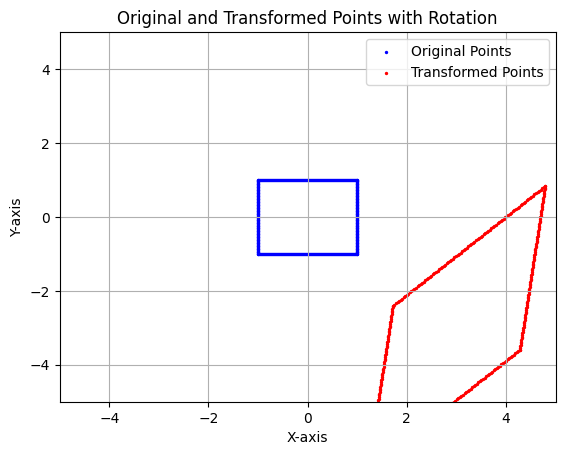

In [29]:
# Plotting the datasets
fig, ax = plt.subplots()
ax.scatter(X[:, 0], X[:, 1], color='blue', label='Original Points', s=2)
ax.scatter(Y_pred[:, 0], Y_pred[:, 1], color='red', label='Transformed Points', s=2)
ax.legend()
ax.set_title('Original and Transformed Points with Rotation')
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_xlim(-5, 5)
ax.set_ylim(-5, 5)
plt.grid(True)
plt.show()

# y = ax + b 

In [30]:
def get_1d_data(n_samples=100, a=8, b=98):
  # Wylosujmy wartości z przedziału [50, 120)
  X = torch.rand(n_samples) * 70 + 50
  # Prawdziwy wzór na dane
  y = a * X + b
  # Dodajmy szum do obserwacji
  y += torch.randn_like(y) * 60.0 
  return X, y

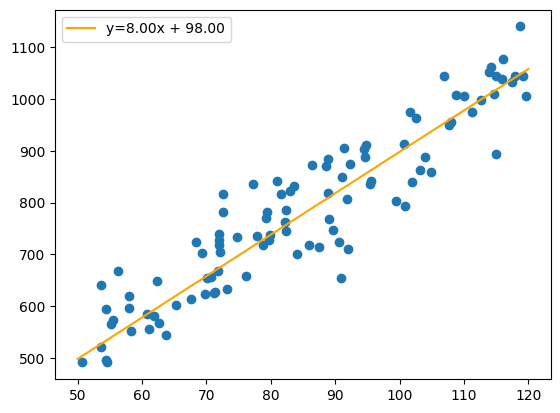

In [31]:
a_true = 8
b_true = 98
X, y = get_1d_data(a=a_true, b=b_true)

X_lin = torch.linspace(50, 120, 10)
y_true = a_true * X_lin + b_true

plt.scatter(X, y)
plt.plot(X_lin, y_true, c='orange', label=f'y={a_true:.2f}x + {b_true:.2f}')
plt.legend()
plt.show()

In [32]:
class LinearRegression1D():
  def __init__(self):
    self.a = None
    self.b = None

  def predict(self, X):
    return self.a * X + self.b

  def estimate_params(self, X, y):
    sum_x = torch.sum(X)
    sum_y = torch.sum(y)
    sum_xy = torch.sum(X * y)
    sum_x2 = torch.sum(X * X)
    n = X.shape[0]

    self.a = (n * sum_xy - sum_x * sum_y) / (n * sum_x2 - sum_x ** 2)
    self.b = (sum_y - self.a * sum_x) / n

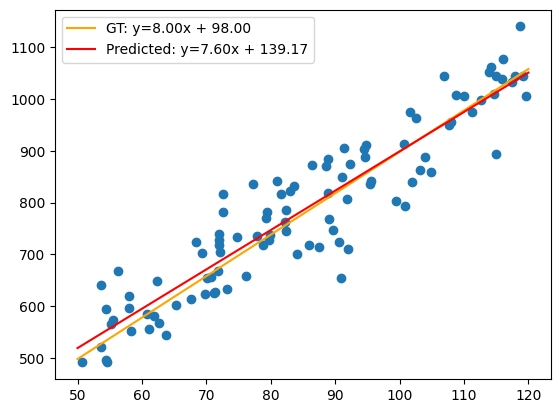

In [33]:
model_1d = LinearRegression1D()
model_1d.estimate_params(X, y)

y_pred = model_1d.predict(X_lin)

plt.scatter(X, y)
plt.plot(X_lin, y_true, c='orange', label=f'GT: y={a_true:.2f}x + {b_true:.2f}')
plt.plot(X_lin, y_pred, c='red', label=f'Predicted: y={model_1d.a:.2f}x + {model_1d.b:.2f}')
plt.legend()
plt.show()

In [34]:
X.shape

torch.Size([100])

# Wielomian

In [35]:
def add_powers(degree, X):
  powers = torch.arange(degree).flip(0)
  X_powers = X[:, None] ** powers
  return X_powers

def calculate_polynomial(coeffs, X):
  if not isinstance(coeffs, torch.Tensor):
    coeffs = torch.tensor(coeffs).float()
  X_powers = add_powers(len(coeffs), X)
  y = X_powers @ coeffs
  return y

def get_polynomial(coeffs, n_samples=100):
  # Wylosujmy wartości z przedziału [0, 7)
  X = torch.rand(n_samples) * 7
  # Prawdziwy wzór na dane
  y = calculate_polynomial(coeffs, X)
  # Dodajmy szum do obserwacji
  y += torch.randn_like(y) / 60
  return X, y

In [36]:
add_powers(3, X[:5])

tensor([[6.3774e+03, 7.9858e+01, 1.0000e+00],
        [8.4481e+03, 9.1913e+01, 1.0000e+00],
        [4.2692e+03, 6.5339e+01, 1.0000e+00],
        [4.9169e+03, 7.0120e+01, 1.0000e+00],
        [5.0570e+03, 7.1113e+01, 1.0000e+00]])

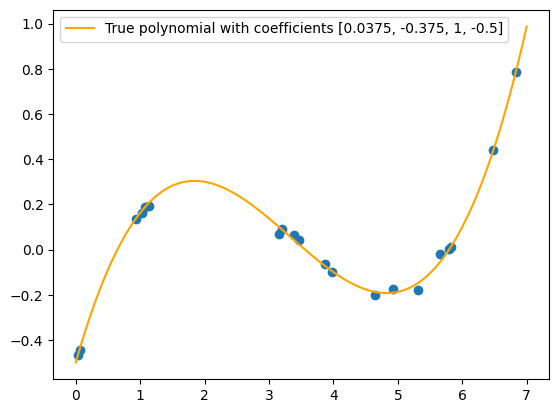

In [37]:
coeffs = [0.0375, -0.375, 1, -0.5]
X, y = get_polynomial(coeffs, n_samples=20)

X_lin = torch.linspace(0, 7, 100)
y_true = calculate_polynomial(coeffs, X_lin)

plt.scatter(X, y)
plt.plot(X_lin, y_true, c='orange', label=f'True polynomial with coefficients {coeffs}')
plt.legend()
plt.show()

In [38]:
class LinearRegressionPoly():
  def __init__(self, degree):
    self.degree = degree
    self.theta = None

  def predict(self, X):
    y = calculate_polynomial(self.theta, X)
    return y

  def estimate_params(self, X, y):
    X_powers = add_powers(self.degree + 1, X)
    self.theta = torch.inverse(X_powers.T @ X_powers) @ X_powers.T @ y

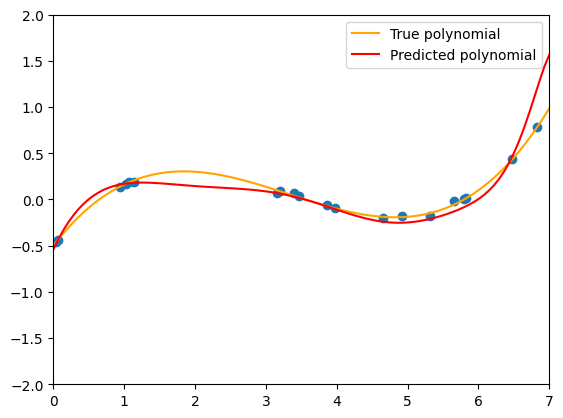

[0.0375, -0.375, 1, -0.5]
tensor([-1.8050e-16,  2.8889e-15, -7.1222e-15, -2.0587e-13,  1.1053e-12,
         1.1442e-11, -1.1608e-10,  1.5765e-10,  3.6463e-09,  6.9074e-09,
        -4.0620e-07,  1.4608e-06,  5.6487e-07,  2.3348e-06, -7.0418e-05,
         2.2749e-03, -1.5277e-02, -1.5437e-02,  4.0021e-01, -1.2970e+00,
         1.6341e+00, -5.3875e-01])


In [39]:
import matplotlib.pyplot as plt

# Assuming model_poly, X, y, X_lin, and y_true are defined correctly
model_poly = LinearRegressionPoly(21)
model_poly.estimate_params(X, y)

y_pred = model_poly.predict(X_lin)

plt.scatter(X, y)
plt.plot(X_lin, y_true, c='orange', label='True polynomial')
plt.plot(X_lin, y_pred, c='red', label='Predicted polynomial')
plt.legend()
plt.xlim(0, 7)   # Set x-axis limits
plt.ylim(-2, 2)  # Set y-axis limits
plt.show()

print(coeffs)  # Assuming 'coeffs' is defined and contains coefficients of the true polynomial
print(model_poly.theta)  # Assuming 'theta' is the parameter attribute of model_poly


# Autograd

In [40]:
class LinearRegressionAutograd(nn.Module):
  def __init__(self, degree):
    super(LinearRegressionAutograd, self).__init__()
    self.degree = degree
    self.theta = nn.Parameter(torch.rand(degree + 1) - 0.5)

  def forward(self, X):
    y = calculate_polynomial(self.theta, X)
    return y
  
def mse_loss(y, y_pred):
  return ((y - y_pred) ** 2).mean()

n_epochs = 30000
learning_rate = 1e-5

model = LinearRegressionAutograd(3)
optimizer = torch.optim.SGD(list(model.parameters()), lr=learning_rate)

In [41]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import torch

# Assuming model, mse_loss, optimizer, X, y, X_lin, y_true, coeffs, and model.theta are defined elsewhere

# Create a figure and axis for plotting
fig, ax = plt.subplots()

# Lists to store data for the animation
lines = []
labels = []

for i in range(n_epochs):
    y_pred = model(X)
    loss = mse_loss(y, y_pred)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if i % 1000 == 0:
        print(f'\rEpoch {i} MSE {loss.item():.4f}', end="")
        
        ax.clear()
        ax.scatter(X, y)
        ax.plot(X_lin, y_true, c='orange', label=f'True polynomial with coefficients {coeffs}')
        
        with torch.no_grad():
            y_pred = model(X_lin)

        theta_formatted = ', '.join(f'{p.item():.2f}' for p in model.theta)
        line = ax.plot(X_lin, y_pred, c='red', label=f'Predicted polynomial with coefficients [{theta_formatted}]')
        ax.legend()
        ax.set_xlim(0, 7)
        ax.set_ylim(-1, 2)
        
        # Save the line object and the label
        lines.append(line[0])
        labels.append(f'Epoch {i}')

# Function to update each frame of the animation
def update(frame):
    line = lines[frame]
    ax.clear()
    ax.scatter(X, y)
    ax.plot(X_lin, y_true, c='orange', label=f'True polynomial with coefficients {coeffs}')
    ax.plot(X_lin, line.get_ydata(), c='red', label=labels[frame])
    ax.legend()
    ax.set_xlim(0, 7)
    ax.set_ylim(-1, 2)
    return line,

# Create the animation
ani = FuncAnimation(fig, update, frames=len(lines), interval=200, blit=False)
plt.close(fig)
# Display the animation
HTML(ani.to_jshtml())


Epoch 29000 MSE 0.0758

# Gradient Descent

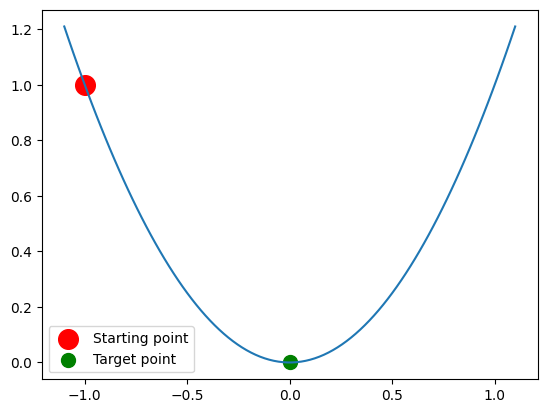

In [42]:
square_fun = lambda x: x ** 2

target_point = (0, 0)
start_point = (-1, square_fun(-1))
x = torch.linspace(-1.1, 1.1, 100)

plt.plot(x, square_fun(x))
plt.scatter(start_point[0], start_point[1], c='red', s=200, label='Starting point')
plt.scatter(target_point[0], target_point[1], c='green', s=100, label='Target point')
plt.legend()
plt.show()

In [43]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import numpy as np

def gradient_descent(learning_rate=0.1, diverge_display=False):
    df_dx = lambda x: 2 * x  # Derivative of the function

    x = np.linspace(-1, 1, 400)  # Adjusted to fit the new x-axis range
    if diverge_display:
        x = np.linspace(-7,7, 400)
    curr_x = start_point[0]
    point_history = []

    fig, ax = plt.subplots()
    ax.plot(x, square_fun(x), label='y = x^2')

    # Plot initial points
    scatter, = ax.plot([], [], 'o', c='orange', ms=5)
    final_point, = ax.plot([], [], 'o', c='red', ms=10, label='Current point')
    target_point_scatter, = ax.plot(target_point[0], target_point[1], 'o', c='green', ms=8, label='Target point')
    ax.set_xlim(-1, 1)  # Adjusted xlim
    ax.set_ylim(-0.1, 1.2)   # Adjusted ylim
    if diverge_display:
        ax.set_xlim(-7, 7)  # Adjusted xlim
        ax.set_ylim(-1, 60)   # Adjusted ylim
        
    ax.legend()

    def init():
        scatter.set_data([], [])
        final_point.set_data([], [])
        return scatter, final_point,

    def update(frame):
        curr_x = frame[0]
        curr_y = frame[1]
        xdata, ydata = scatter.get_data()
        xdata = np.append(xdata, curr_x)
        ydata = np.append(ydata, curr_y)
        scatter.set_data(xdata, ydata)
        final_point.set_data(curr_x, curr_y)
        return scatter, final_point,

########################################################################################
    # Running the gradient descent and recording points
    for i in range(100):
        curr_x = curr_x - learning_rate * df_dx(curr_x)
        point_history.append((curr_x, square_fun(curr_x)))
########################################################################################

    ani = FuncAnimation(fig, update, frames=point_history, init_func=init, blit=True, repeat=False, interval=100)
    plt.close(fig)
    return HTML(ani.to_jshtml())



In [44]:

# Example use
gradient_descent(learning_rate=0.01)


/tmp/ipykernel_6384/2430751604.py:42: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  final_point.set_data(curr_x, curr_y)


In [45]:

# Example use
gradient_descent(learning_rate=1.01, diverge_display=True)


/tmp/ipykernel_6384/2430751604.py:42: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  final_point.set_data(curr_x, curr_y)


In [46]:

# Example use
gradient_descent(learning_rate=0.001)


/tmp/ipykernel_6384/2430751604.py:42: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  final_point.set_data(curr_x, curr_y)
